In [2]:
# load bike count data
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [30]:
# Load the CSV files into DataFrames
file_path_counts = '../data/raw/bike-counts.csv'
file_path_locations = '../data/raw/bike-counts-locations.csv'

bike_counts_df = pd.read_csv(file_path_counts)
bike_counts_locations_df = pd.read_csv(file_path_locations)

In [31]:
# Display the first few rows of bike_counts_df
print("First few rows of bike_counts_df:")
print(bike_counts_df.head())

# Display the summary statistics of bike_counts_df
print("\nSummary statistics of bike_counts_df:")
print(bike_counts_df.describe())

# Display the first few rows of bike_counts_locations_df
print("\nFirst few rows of bike_counts_locations_df:")
print(bike_counts_locations_df.head())

# Display the summary statistics of bike_counts_locations_df
print("\nSummary statistics of bike_counts_locations_df:")
print(bike_counts_locations_df.describe())

First few rows of bike_counts_df:
         date     heure  id_compteur  nb_passages  longitude   latitude
0  2024-01-01  00:00:00  100054073.0          0.0 -73.590636  45.560713
1  2024-01-01  00:00:00  300021685.0          0.0 -73.613370  45.631590
2  2024-01-01  00:00:00  100003040.0          0.0 -73.544410  45.501270
3  2024-01-01  00:00:00  100052606.0          0.0 -73.538819  45.555084
4  2024-01-01  00:00:00  100003032.0          1.0 -73.562970  45.516216

Summary statistics of bike_counts_df:
        id_compteur   nb_passages     longitude      latitude
count  1.458633e+06  1.458633e+06  1.458633e+06  1.458633e+06
mean   1.584667e+08  1.256845e+01 -7.358594e+01  4.553712e+01
std    9.094870e+07  2.420641e+01  3.978880e-02  3.981683e-02
min    1.000018e+08  0.000000e+00 -7.367342e+01  4.547049e+01
25%    1.000122e+08  0.000000e+00 -7.360957e+01  4.551622e+01
50%    1.000526e+08  3.000000e+00 -7.358866e+01  4.553027e+01
75%    3.000150e+08  1.500000e+01 -7.355960e+01  4.555089e+01

In [32]:
# Transform the columns id_compteur and nb_passages from float64 to integers
bike_counts_df['id_compteur'] = bike_counts_df['id_compteur'].astype('Int64')
bike_counts_df['nb_passages'] = bike_counts_df['nb_passages'].astype('Int64')

# Display the data types of bike_counts_df
print("Data types in bike_counts_df:")
print(bike_counts_df.dtypes)

# Display the data types of bike_counts_locations_df
print("\nData types in bike_counts_locations_df:")
print(bike_counts_locations_df.dtypes)

Data types in bike_counts_df:
date            object
heure           object
id_compteur      Int64
nb_passages      Int64
longitude      float64
latitude       float64
dtype: object

Data types in bike_counts_locations_df:
ID                  int64
Ancien_ID         float64
Nom                object
Statut             object
Latitude          float64
Longitude         float64
Annee_implante      int64
dtype: object


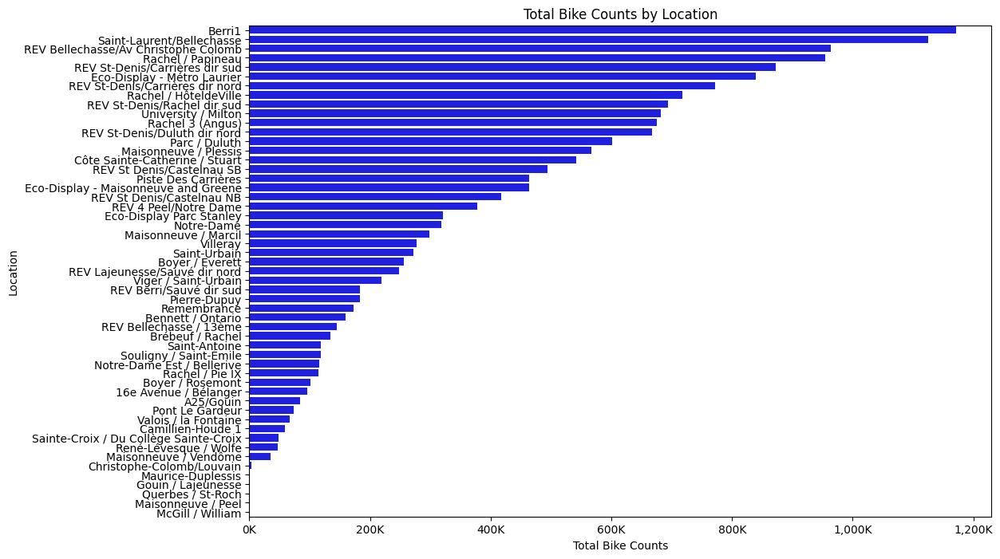

In [33]:
#merge the two dataframes
merged_df = pd.merge(bike_counts_df, bike_counts_locations_df, left_on='id_compteur', right_on='ID')
agg_counts = merged_df.groupby(['ID','Nom', 'Longitude', 'Latitude'])['nb_passages'].sum().reset_index().sort_values('nb_passages', ascending=False)

from matplotlib.ticker import ScalarFormatter

# Plot the aggregated data using a bar chart
plt.figure(figsize=(12, 8))
sns.barplot(x='nb_passages', y='Nom', data=agg_counts, color='#0000FF')  # Use hex color code for blue
plt.xlabel('Total Bike Counts')
plt.ylabel('Location')
plt.title('Total Bike Counts by Location')

# Disable scientific notation on the x-axis
plt.gca().xaxis.set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x/1000)) + 'K'))
plt.show()


In [26]:
import folium
import json

# Reset the index of agg_counts
agg_counts = agg_counts.reset_index(drop=True)

# Load the bikelane-infra.json data
file_path_bikelane_infra = '../data/raw/bikelane-infra.json'
with open(file_path_bikelane_infra) as f:
    bikelane_infra = json.load(f)

# Create a map centered around the average latitude and longitude
map_center = [agg_counts['Latitude'].mean(), agg_counts['Longitude'].mean()]
bike_map = folium.Map(location=map_center, zoom_start=12)

# Add the bikelane infrastructure to the map
folium.GeoJson(
    bikelane_infra,
    name='Bike Lane Infrastructure',
    style_function=lambda feature: {
        'color': 'blue',
        'weight': 1.5,
        'opacity': 0.6
    }
).add_to(bike_map)

# Add circle markers to the map
for idx, row in agg_counts.iterrows():
    color = 'blue' if idx < 5 else '#3BBA9C'
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=row['nb_passages'] / 50000,  # Adjust the radius based on bike count value
        popup=f"{row['Nom']}: {row['nb_passages']:,} bike counts",
        color=color,
        fill=True,
        fill_color=color
    ).add_to(bike_map)

# Display the map
bike_map

C:\Users\jimmy\AppData\Local\Temp\ipykernel_7236\3059509557.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_10_df['date'] = pd.to_datetime(top_10_df['date'])
C:\Users\jimmy\AppData\Local\Temp\ipykernel_7236\3059509557.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_10_df['week'] = top_10_df['date'].dt.isocalendar().week


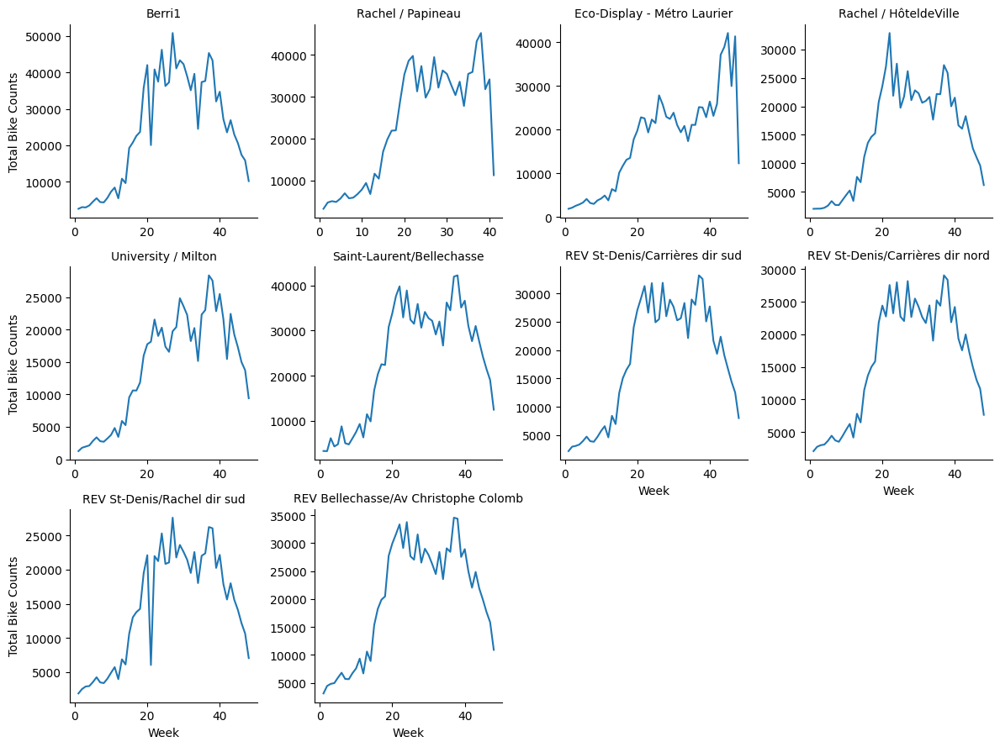

In [27]:
#retrieve top 10 locations
top_10_locations = agg_counts.head(10)

#filter bike_counts_df to only include the top 10 locations
top_10_df = bike_counts_df[bike_counts_df['id_compteur'].isin(top_10_locations['ID'])]

# Convert the 'date' column to datetime
top_10_df['date'] = pd.to_datetime(top_10_df['date'])

# Add a 'week' column to the dataframe
top_10_df['week'] = top_10_df['date'].dt.isocalendar().week

# Aggregate the data by week and location
weekly_counts = top_10_df.groupby(['id_compteur', 'week'])['nb_passages'].sum().reset_index()

# Merge with the locations dataframe to get the names of the locations
weekly_counts = pd.merge(weekly_counts, bike_counts_locations_df[['ID', 'Nom']], left_on='id_compteur', right_on='ID')

# Create the small multiple chart
g = sns.FacetGrid(weekly_counts, col='Nom', col_wrap=4, height=3, sharex=False, sharey=False)
g.map(sns.lineplot, 'week', 'nb_passages')

# Set the axis labels and titles
g.set_axis_labels('Week', 'Total Bike Counts')
g.set_titles(col_template='{col_name}')

plt.show()

In [28]:
# Filter weekly_counts to include only the top 10 locations
top_10_weekly_counts = weekly_counts[weekly_counts['id_compteur'].isin(top_10_locations['ID'])]

# Calculate the weekly variance of bike counts for each station
weekly_variance = top_10_weekly_counts.groupby('id_compteur')['nb_passages'].var().reset_index()
weekly_variance.columns = ['id_compteur', 'variance']

# Calculate the total bike count for the year for each station
total_counts = top_10_weekly_counts.groupby('id_compteur')['nb_passages'].sum().reset_index()
total_counts.columns = ['id_compteur', 'total_counts']

# Merge the variance and total counts dataframes
variance_df = pd.merge(weekly_variance, total_counts, on='id_compteur')

# Normalize the variance by dividing it by the total bike count for the year
variance_df['normalized_variance'] = variance_df['variance'] / variance_df['total_counts']

# Merge with the locations dataframe to get the names of the locations
variance_df = pd.merge(variance_df, bike_counts_locations_df[['ID', 'Nom']], left_on='id_compteur', right_on='ID')

# Identify the station with the highest normalized variance
highest_variance_station = variance_df.loc[variance_df['normalized_variance'].idxmax()]
lowest_variance_station = variance_df.loc[variance_df['normalized_variance'].idxmin()]

print("Station with the highest normalized variance:")
print(highest_variance_station)

print("Station with the lowest normalized variance:")
print(lowest_variance_station)

Station with the highest normalized variance:
id_compteur                    100003034
variance                186188227.787805
total_counts                      954741
normalized_variance           195.014384
ID                             100003034
Nom                    Rachel / Papineau
Name: 1, dtype: object
Station with the lowest normalized variance:
id_compteur                              300014996
variance                           66897824.537234
total_counts                                693630
normalized_variance                      96.445979
ID                                       300014996
Nom                    REV St-Denis/Rachel dir sud
Name: 8, dtype: object


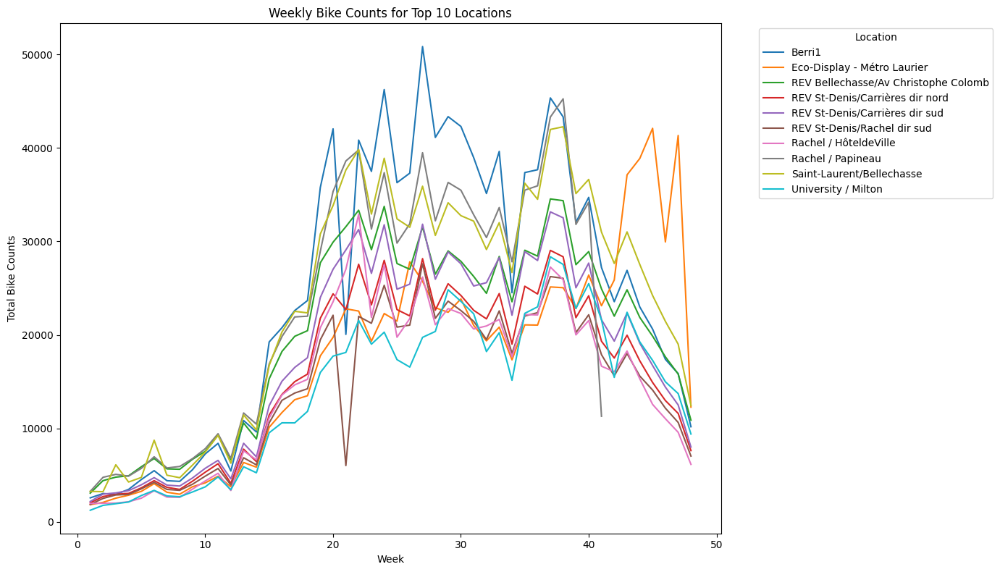

In [29]:
# Pivot the data to have weeks as the index and locations as columns
weekly_counts_pivot = weekly_counts.pivot(index='week', columns='Nom', values='nb_passages')

# Plot the data
plt.figure(figsize=(14, 8))
for column in weekly_counts_pivot.columns:
    plt.plot(weekly_counts_pivot.index, weekly_counts_pivot[column], label=column)

plt.xlabel('Week')
plt.ylabel('Total Bike Counts')
plt.title('Weekly Bike Counts for Top 10 Locations')
plt.legend(title='Location', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()